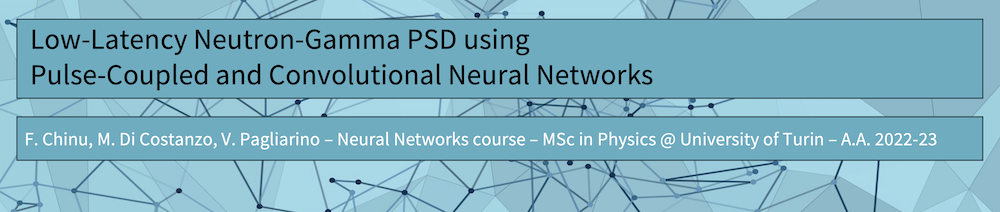

# Figures

In [1]:
import seaborn as sns
import altair as alt
import random
#https://altair-viz.github.io/gallery/

import plotly.graph_objects as go
import plotly.express as px
import numpy as np
import pandas as pd
import pickle
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.utils import shuffle
from matplotlib import pyplot as plt
import matplotlib as mpl
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sb

### Fig 1: Signals

In [2]:
with open('./arrays/dataset3_PCNN_Out_loose.p', 'rb') as handle:
    trainingSetDict = pickle.load(handle)

trainSetGamma = trainingSetDict['raw_gamma']
trainSetNeutron = trainingSetDict['raw_neutron']

trainSetGamma = trainSetGamma[0:min(len(trainSetGamma),len(trainSetNeutron))]
trainSetNeutron = trainSetNeutron[0:min(len(trainSetGamma),len(trainSetNeutron))]

### ENCODING! 0 = Gamma, 1 = Neutron
trainingSetValues_ = np.vstack((trainSetGamma, trainSetNeutron))
trainingSetLabels_ = np.array([0,] * len(trainSetGamma) + [1,] * len(trainSetNeutron))

### Data augmentation with negative polarity pulses
trainingSetValues = np.vstack((trainingSetValues_,trainingSetValues_*-1.0))
trainingSetLabels = np.tile(trainingSetLabels_, (1,2)).transpose()

### Require traslational invariance
for i in range(len(trainingSetValues)):
    ### WARNING!!! DISABLE THIS FOR SPATIAL ATTENTION ANALYSIS ACROSS MINIBATCHES!
    shift = random.randint(-60, 180)
    trainingSetValues[i] = np.roll(trainingSetValues[i], shift)

trainingSetValues, trainingSetLabels = shuffle(trainingSetValues, trainingSetLabels, random_state=4)

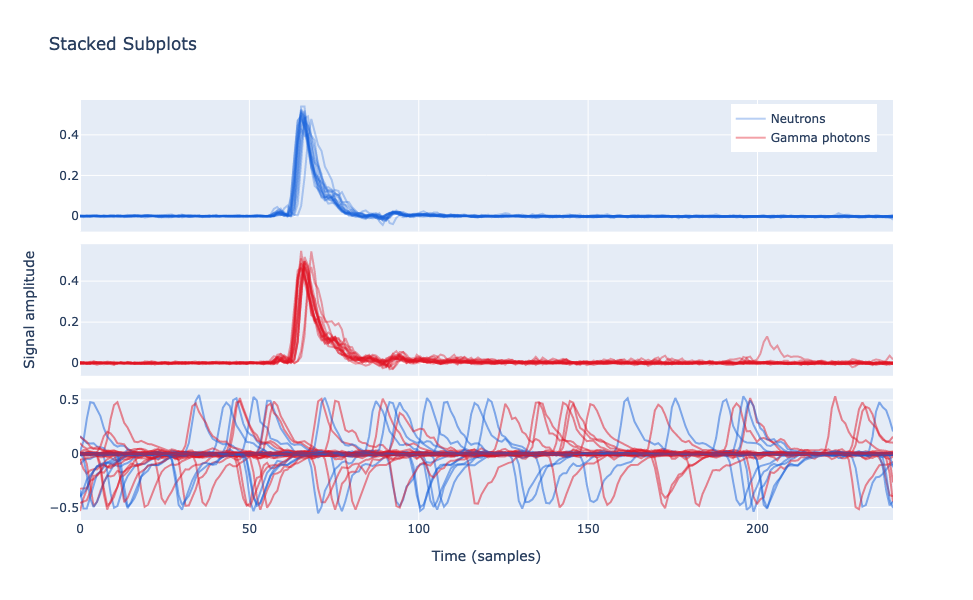

In [4]:
fig = make_subplots(rows=3, cols=1, shared_xaxes=True,vertical_spacing=0.03)

t1 = go.Scatter(
    x=np.linspace(0, 240, 240),
    y=trainingSetValues_[trainingSetLabels_ == 0][15],
    line=dict(color="#1660d9"),
    opacity=0.3,
    name="Neutrons"
)
fig.append_trace(t1, row=1, col=1)

t2 = go.Scatter(
    x=np.linspace(0, 240, 240),
    y=trainingSetValues_[trainingSetLabels_ == 1][15],
    line=dict(color="#e01425"),
    opacity=0.4,
    name="Gamma photons"
)
fig.append_trace(t2, row=2, col=1)
    
for i in range(15):
    t1 = go.Scatter(
        x=np.linspace(0, 240, 240),
        y=trainingSetValues_[trainingSetLabels_ == 0][i],
        line=dict(color="#1660d9"),
        opacity=0.3,
        showlegend=False
    )
    fig.append_trace(t1, row=1, col=1)

for i in range(15):
    t2 = go.Scatter(
        x=np.linspace(0, 240, 240),
        y=trainingSetValues_[trainingSetLabels_ == 1][i],
        line=dict(color="#e01425"),
        opacity=0.4,
        showlegend=False
    )
    fig.append_trace(t2, row=2, col=1)

for i in range(50):
    t3 = go.Scatter(
        x=np.linspace(0, 240, 240),
        y=trainingSetValues[trainingSetLabels[:,0] == 0][i],
        line=dict(color="#1660d9"),
        opacity=0.5,
        showlegend=False
    )
    fig.append_trace(t3, row=3, col=1)
    
    fig.append_trace(go.Scatter(
        x=np.linspace(0, 240, 240),
        y=trainingSetValues[trainingSetLabels[:,0] == 1][i],
        line=dict(color="#e01425"),
        opacity=0.5,
        showlegend=False
    ), row=3, col=1)
    

custom_legend_entries = [
    {'name': 'Neutrons', 'trace': t1},
    {'name': 'Gamma photons', 'trace': t2},
    {'name': 'Data augmentation', 'trace': t3},
]

fig.update_layout(height=600, width=600, title_text="Stacked Subplots", 
                  legend=dict(
                    yanchor="top",
                    y=0.99,
                    xanchor="right",
                    x=0.98))

fig['layout']['xaxis3']['title']='Time (samples)'
fig['layout']['yaxis2']['title']='Signal amplitude'

fig.write_image("./figures/signals.pdf")
fig.show()

### Fig 2: PCNN distributions


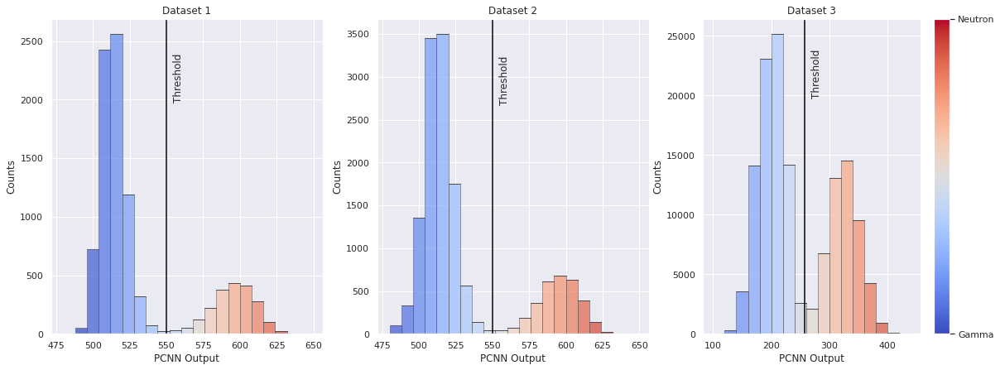

In [14]:
f, axes = plt.subplots(nrows=1, ncols=3,figsize=(20, 7))
#sb.despine(f)

#Dataset 1
with open('./arrays/dataset1_PCNN_Out.p', 'rb') as handle:
    R = pickle.load(handle)['getPCNNr']

bins= np.arange(480,650,8)
R_bins = np.digitize(R,bins)
#sb.despine(f)

sb.histplot(
    x=R, hue=R_bins,
    bins=bins,
    palette="coolwarm",
    edgecolor=".3",
    multiple='stack',
    linewidth=.5,
    log_scale=False,
    legend = False,
    cbar=True, 
    ax=axes[0]
)
axes[0].set(xlabel ="PCNN Output", ylabel = "Counts", title = "Dataset 1")

cbar = plt.colorbar(mpl.image.AxesImage(axes[2], cmap = "coolwarm"), orientation="vertical", ticks=[0, 1])
cbar.ax.set_yticklabels(['Gamma', 'Neutron'])

thr = 550 
axes[0].axvline(x=thr, c="black")
axes[0].text(thr*1.008, 2000, 'Threshold', rotation = "vertical");

#Dataset 2
with open('./arrays/dataset2_PCNN_Out.p', 'rb') as handle:
    R = pickle.load(handle)['getPCNNr']

bins= np.arange(480,650,8)
R_bins = np.digitize(R,bins)
#sb.despine(f)

sb.histplot(
    x=R, hue=R_bins,
    bins=bins,
    palette="coolwarm",
    edgecolor=".3",
    multiple='stack',
    linewidth=.5,
    log_scale=False,
    legend = False,
    cbar=True, 
    ax=axes[1]
)
axes[1].set(xlabel ="PCNN Output", ylabel = "Counts", title = "Dataset 2")


thr = 550 
axes[1].axvline(x=thr, c="black")
axes[1].text(thr*1.008, 2700, 'Threshold', rotation = "vertical");

#Dataset 3
with open('./arrays/dataset3_PCNN_Out_loose.p', 'rb') as handle:
    R_val3 = pickle.load(handle)

R_val3_neutron = R_val3['getPCNNr_neutron']
R_val3_gamma = R_val3['getPCNNr_gamma']

R = np.concatenate((R_val3_neutron,R_val3_gamma))
    
bins= np.arange(100,450,20)
R_bins = np.digitize(R,bins)
#sb.despine(f)

ax1 = sb.histplot(
    x=R, hue=R_bins,
    bins=bins,
    palette="coolwarm",
    edgecolor=".3",
    multiple='stack',
    linewidth=.5,
    log_scale=False,
    legend = False,
    cbar=True, 
    ax=axes[2]
)

axes[2].set(xlabel ="PCNN Output", ylabel = "Counts", title = "Dataset 3")


thr = 258 
axes[2].axvline(x=thr, c="black")
axes[2].text(thr*1.04, 20000, 'Threshold', rotation = "vertical");
f.savefig("./figures/PCNN_Output_Distribution.pdf",bbox_inches='tight')

### Fig 3: Tranining and ROC

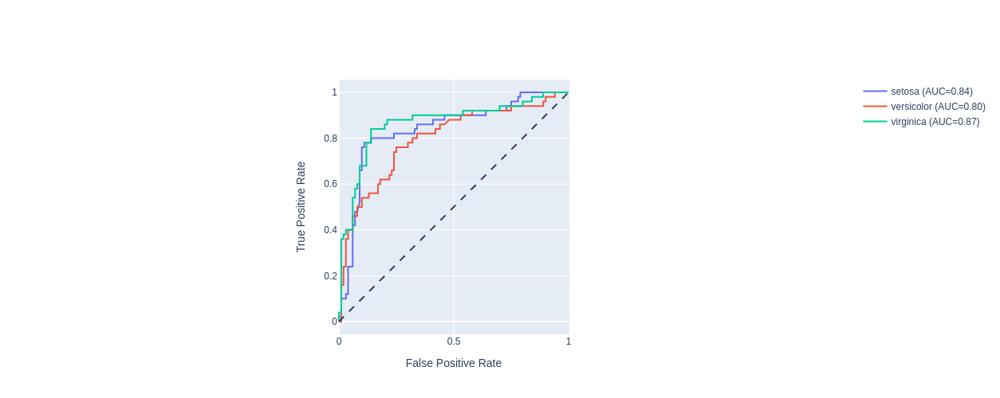

In [6]:


np.random.seed(0)

# Artificially add noise to make task harder
df = px.data.iris()
samples = df.species.sample(n=50, random_state=0)
np.random.shuffle(samples.values)
df.loc[samples.index, 'species'] = samples.values

# Define the inputs and outputs
X = df.drop(columns=['species', 'species_id'])
y = df['species']

# Fit the model
model = LogisticRegression(max_iter=200)
model.fit(X, y)
y_scores = model.predict_proba(X)

# One hot encode the labels in order to plot them
y_onehot = pd.get_dummies(y, columns=model.classes_)

# Create an empty figure, and iteratively add new lines
# every time we compute a new class
fig = go.Figure()
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

for i in range(y_scores.shape[1]):
    y_true = y_onehot.iloc[:, i]
    y_score = y_scores[:, i]

    fpr, tpr, _ = roc_curve(y_true, y_score)
    auc_score = roc_auc_score(y_true, y_score)

    name = f"{y_onehot.columns[i]} (AUC={auc_score:.2f})"
    fig.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'))

fig.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    yaxis=dict(scaleanchor="x", scaleratio=1),
    xaxis=dict(constrain='domain'),
    width=700, height=500
)
fig.show()

### Model Interpretation: t-SNE

In [7]:
from sklearn.manifold import TSNE
import plotly.express as px

with open('./model/tsne.p', 'rb') as handle:
    tsne_dict = pickle.load(handle)

tsne = tsne_dict['tsne']
labels = tsne_dict['labels']

tsne.shape

(10000, 3)

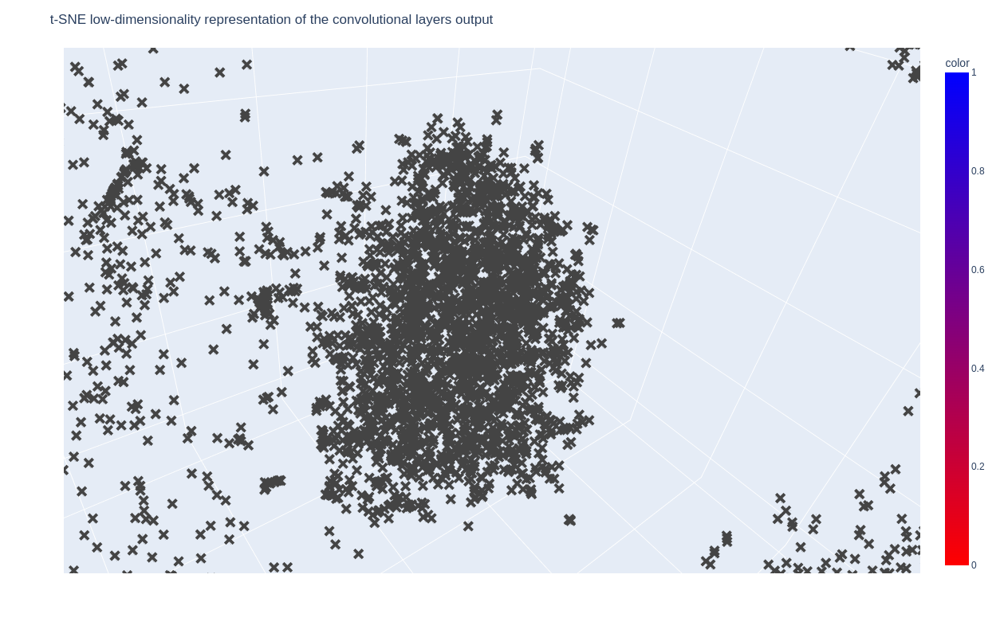

In [8]:
fig = px.scatter_3d(
    x=tsne[:,0], y=tsne[:,1] * -1.0, z=tsne[:,2] * -1.0,
    color=labels, color_continuous_scale='Bluered_r')

fig.update_traces(marker=dict(size=1.8, symbol="diamond", line=dict(width=8)))

fig.update_layout(
    autosize=False,
    width=800,
    height=800,
    title = "t-SNE low-dimensionality representation of the convolutional layers output")

fig.show()

### Model interpretation: saliency map

In [3]:
with open('./model/saliency_map.p', 'rb') as handle:
    saliency_dict = pickle.load(handle)
    
with open('./model/occlusedDataset.p', 'rb') as handle:
    occlusedDatasets = pickle.load(handle)


In [4]:
y_scores = saliency_dict['y_scores']
y_acc = saliency_dict['y_acc']

In [5]:
saliency_dict = {'y_scores' : y_scores, 'y_acc' : y_acc}

with open('./model/saliency_map.p', 'wb') as handle:
    pickle.dump(saliency_dict, handle, protocol=pickle.HIGHEST_PROTOCOL);

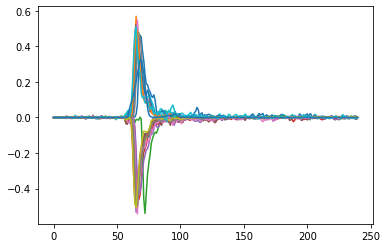

In [6]:
for i in range(20):
    plt.plot(occlusedDatasets[0][i])
plt.plot(np.linspace(0, 240, len(y_acc)), 1-np.array(y_acc))

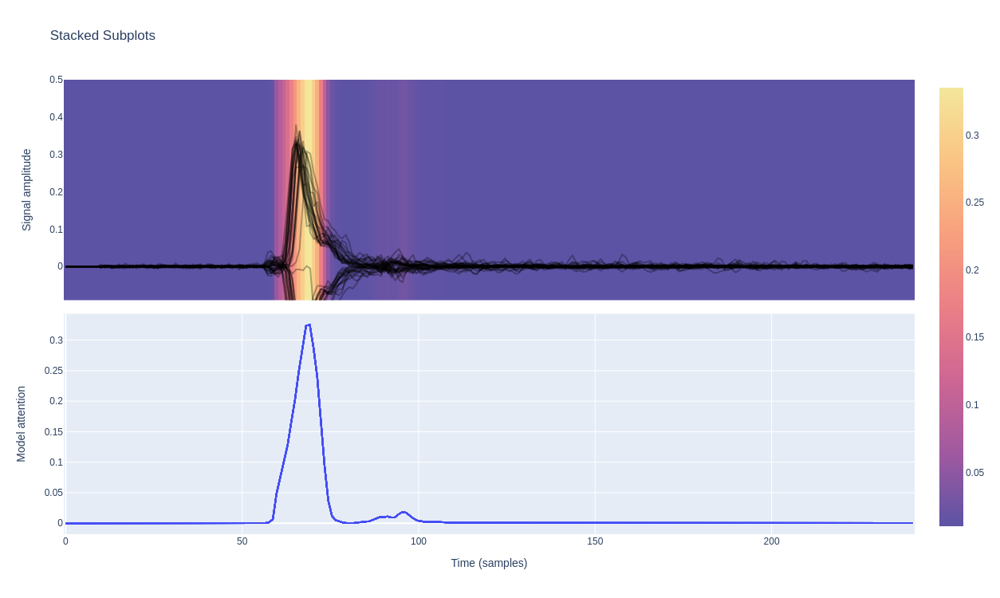

In [ ]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True,vertical_spacing=0.03)

for i in range(40):
    t1 = go.Scatter(
        x=np.linspace(0, 240, len(y_acc)),
        y=1-np.array(y_acc),
        opacity=0.3,
        showlegend=False,
        line=dict(color="#424bf5")
    )
    fig.append_trace(t1, row=2, col=1)
    
for i in range(40):
    t1 = go.Scatter(
        x=np.linspace(0, 240, 240),
        y=occlusedDatasets[0][i] / 1.5,
        line=dict(color="#000000"),
        opacity=0.3,
        showlegend=False
    )
    fig.append_trace(t1, row=1, col=1)
    
fig.append_trace(go.Heatmap(
        z=(1.01-(np.array(y_acc))),
        x=np.linspace(0, 240, len(y_acc)),
        y=np.zeros(len(y_acc)),
        colorscale='sunset_r'),
        row=1,col=1)


fig.update_layout(height=750, width=600, title_text="Stacked Subplots", 
                  legend=dict(
                    yanchor="top",
                    y=0.99,
                    xanchor="right",
                    x=0.98),
                    yaxis_range=[-0.09,0.5])

fig['layout']['xaxis']['title']=''
fig['layout']['yaxis']['title']='Signal amplitude'
fig['layout']['xaxis2']['title']='Time (samples)'
fig['layout']['yaxis2']['title']='Model attention'


fig.write_image("./figures/occlusion.pdf")
fig.show()

## Fig. 4: Tranfer learning

Keras model archive loading:
File Name                                             Modified             Size
config.json                                    2023-06-29 06:49:08         3360
variables.h5                                   2023-06-29 06:49:08        87824
metadata.json                                  2023-06-29 06:49:08           64
Keras weights file (<HDF5 file "variables.h5" (mode r)>) loading:
...layers
......conv1d
.........vars
............0
............1
......conv1d_1
.........vars
............0
............1
......dense
.........vars
............0
............1
......dense_1
.........vars
............0
............1
......flatten
.........vars
......max_pooling1d
.........vars
......max_pooling1d_1
.........vars
...metrics
......mean
.........vars
............0
............1
......mean_metric_wrapper
.........vars
............0
............1
...vars
     x  Validation  Training
0    0    0.726353  0.732972
1    1    0.709695  0.718808
2    2    0.684539  0.699187

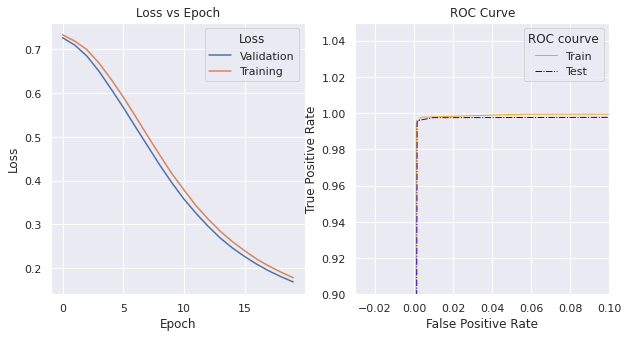

In [5]:
sb.set_theme(style='darkgrid')

f, axes = plt.subplots(nrows=1, ncols=2,figsize=(10, 5))
#f.suptitle('Transfer Learning', fontsize=18)
#sb.despine(f)

with open('./model/Transf_metrics_ds1.p', 'rb') as handle:
    metrics = pickle.load(handle)
    
history = metrics['hist']

bins= list(np.arange(0,20,1))
#sb.despine(f)

df = pd.DataFrame()
df['x']= bins
df['Validation']=history.history['val_loss']
df['Training']=history.history['loss']

dfm = df.melt('x', var_name='Loss', value_name='vals')
print(df)
sb.lineplot(
    data=dfm,
    x='x',
    y='vals',
    hue='Loss',
    ax=axes[0]
)
axes[0].set(xlabel ="Epoch", ylabel = "Loss", title = "Loss vs Epoch")
#metrics = {'hist': transfHistory, 'Trainfpr': fpr, 'Traintpr': tpr, 'Testfpr': Testfpr, 'Testtpr': Testtpr}
df = pd.DataFrame()
df['Trainfpr']= metrics['Trainfpr']
df['Traintpr']= metrics['Traintpr']
df['Testfpr']= metrics['Testfpr']
df['Testtpr']= metrics['Testtpr']

sb.lineplot(
    data=df,
    x='Trainfpr',
    y='Traintpr',
    ax=axes[1],
    color='orange',
    linewidth = 1.,
    ci=None
)

sb.lineplot(
    data=df,
    x='Testfpr',
    y='Testtpr',
    ax=axes[1],
    color='blue',
    linestyle = 'dashdot',
    linewidth = 1.,
    ci=None
)

axes[1].set(xlabel ="False Positive Rate", ylabel = "True Positive Rate", title = "ROC Curve",ylim=(0.9, 1.05),xlim=(-0.03, .1))
plt.legend(title = 'ROC courve', labels = ['Train', 'Test'])

f.savefig("./figures/Transfer_Learning.pdf")

In [61]:
print(metrics['Testfpr'])
print(metrics['Testtpr'])

[0.         0.         0.         0.00163399 0.00163399 0.00980392
 0.00980392 0.99346405 0.99346405 1.        ]
[0.         0.00167504 0.99497487 0.99497487 0.99664992 0.99664992
 0.99832496 0.99832496 1.         1.        ]
